### Part 1: Data Reading

In [1]:
# basic imports
import pandas as pd
import numpy as np
import datetime
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, Normalizer
from sklearn.decomposition import PCA
from IPython.display import HTML
from collections import defaultdict
from sklearn.model_selection import ParameterGrid
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from tqdm import tqdm_notebook as tqdm
pd.set_option('display.max_columns', 500)

In [2]:
plt.rcParams["figure.figsize"] = (16,12)

In [3]:
# read the data
df = pd.read_csv('dump/realtimedata.csv', header=None)
dist = pd.read_csv('stopbyroute_updated_final.csv')

In [4]:
# rename columns of the actual df
df.columns = ['ServiceDelivery_ResponseTimestamp',
'ServiceDelivery_ProducerRef',
'ServiceDelivery_Status',
'ServiceDelivery_MoreData',
'StopMonitoringDelivery_Version',
'StopMonitoringDelivery_ResponseTimestamp',
'StopMonitoringDelivery_RequestMessageRef',
'MonitoredStopVisit_RecordedAtTime',
'StopNumber',
'MonitoredVehicleJourney_LineRef',
'MonitoredVehicleJourney_DirectionRef',
'FramedVehicleJourneyRef_DataFrameRef',
'FramedVehicleJourneyRef_DatedVehicleJourneyRef',
'RouteNumber',
'MonitoredVehicleJourney_OperatorRef',
'DestinationStop',
'DestinationName',
'MonitoredVehicleJourney_Monitored',
'MonitoredVehicleJourney_InCongestion',
'MonitoredVehicleJourney_BlockRef',
'MonitoredVehicleJourney_VehicleRef',
'MonitoredCall_VisitNumber',
'MonitoredCall_VehicleAtStop',
'MonitoredCall_AimedArrivalTime',
'MonitoredCall_ExpectedArrivalTime',
'MonitoredCall_AimedDepartureTime',
'MonitoredCall_ExpectedDepartureTime',
'scrapetime',
'aimed_minutes_due',
'expected_minutes_due',
'ID',
'Day',
'Month',
'Season',
'TimeOfDay',
'Special',
'BusShare']

### Part 2: Data Reading Processing

#### 2.1 Take only the relevant columns

The main idea is to subset the dataframe to take columns of interest and save the storing space for pandas. We will take only the columns 'StopNumber', 'RouteNumber', 'MonitoredVehicleJourney_DirectionRef', 'MonitoredCall_AimedArrivalTime' and 'MonitoredCall_ExpectedArrivalTime' 

In [5]:
# ingest only required columns
df = df[['RouteNumber', 'StopNumber', 'MonitoredVehicleJourney_DirectionRef', 'MonitoredCall_AimedArrivalTime', 'MonitoredCall_ExpectedArrivalTime']]

In [6]:
df.head()

,RouteNumber,StopNumber,MonitoredVehicleJourney_DirectionRef,MonitoredCall_AimedArrivalTime,MonitoredCall_ExpectedArrivalTime
0,1,12,Inbound,2019-01-31 14:18:02,2019-01-31 14:17:31
1,1,12,Inbound,2019-01-31 14:33:02,2019-01-31 14:31:58
2,1,14,Inbound,2019-01-29 14:04:11,2019-01-29 13:59:37
3,1,14,Inbound,2019-01-31 13:49:11,2019-01-31 13:56:45
4,1,15,Inbound,2019-01-29 14:05:19,2019-01-29 14:00:45


#### 2.2 Find the delay and drop the 'MonitoredCall_AimedArrivalTime' and 'MonitoredCall_ExpectedArrivalTime'

We are interested in finding the delay between each stop.

In [7]:
# change the datatypes
df['MonitoredCall_AimedArrivalTime'] = df['MonitoredCall_AimedArrivalTime'].astype('datetime64')
df['MonitoredCall_ExpectedArrivalTime'] = df['MonitoredCall_ExpectedArrivalTime'].astype('datetime64')

In [8]:
# create delay_sec
df['delay_sec'] = (df['MonitoredCall_ExpectedArrivalTime'] - df['MonitoredCall_AimedArrivalTime'])/np.timedelta64(1,'s')

In [9]:
df['delay_sec'] = df['delay_sec'].astype('int')

In [10]:
# drop the estimated and actual time
df.drop(['MonitoredCall_AimedArrivalTime', 'MonitoredCall_ExpectedArrivalTime'], axis=1, inplace=True)

#### 2.3 Clean the 'MonitoredVehicleJourney_DirectionRef' column for space saving

Just renaming the column values for saving storage space and also making it join compatible.

In [11]:
# replace the values for direction of the traffic
df.MonitoredVehicleJourney_DirectionRef = df.MonitoredVehicleJourney_DirectionRef.replace({'Inbound':'I', 'Outbound':'O'})

In [12]:
df.head()

,RouteNumber,StopNumber,MonitoredVehicleJourney_DirectionRef,delay_sec
0,1,12,I,-31
1,1,12,I,-64
2,1,14,I,-274
3,1,14,I,454
4,1,15,I,-274


#### 2.4 Clean the stopbyroutes for join compatibiltiy

Since there exists some problems in parsing the dataframes, we need to subset it to get rid of the quotation marks.

In [13]:
# remove the extra quotes in routes
dist['route_clean'] = dist.Route.apply(lambda x: x[1:-1])

In [14]:
# sanity check that all stops has unique lat and long
assert(dist.Stopno.nunique() == dist[['Stopno', 'lat', 'long']].drop_duplicates().shape[0])

In [15]:
# drop unnecessary columns
dist.drop(['Route', 'Address', 'SeqNumber', 'seqNumberExt', 'lat', 'long', 'lat_last', 'long_last', 'Order'], axis=1, inplace=True)

In [16]:
dist.head()

,Direction,Stopno,lastStop,Stopno_last,dist1,route_clean
0,I,10,278.0,278.0,2.5592,1
1,I,12,10.0,10.0,1.2296,1
2,I,14,12.0,12.0,0.5738,1
3,I,15,14.0,14.0,0.7226,1
4,I,17,15.0,15.0,0.6769,1


### Part 3: Clustering Data Preparation

#### 3.1 Clean and join the distance data with the realtime data

The main idea here is to join the realtime data with the distance data that has the details of the last stop. With the help of this join, we can find the delay per kilometer.

Since, we understand the concept that the velocity is constant for a stop, the delay can be equally divided amongst the kilometers. This provides a general idea of negative speed assuming the velocity is constant.

In [17]:
df.shape[0]

17728612

In [18]:
# list of routes that are there in transcation but not in the stop by route
# this will automatically get removed when we will join the dataset
set(df.RouteNumber.unique()) - set(dist.route_clean.unique())

{'16D', '33E', '41D', '69'}

In [19]:
# Perform the join and print the shape
df_join = df.merge(dist, 
         left_on=['RouteNumber', 'StopNumber', 'MonitoredVehicleJourney_DirectionRef'],
         right_on=['route_clean', 'Stopno', 'Direction'])

In [20]:
# check the shape after the join
df_join.shape[0]

17564103

In [21]:
# clean the column names
df_join.drop(['Direction', 'Stopno', 'route_clean', 'lastStop'], axis=1, inplace=True)
df_join.columns = ['RouteNumber', 'StopNumber', 'MonitoredVehicleJourney_DirectionRef', 'Delay_s', 'StopNumberLast', 'DistanceTraveled_km']

In [22]:
df_join.head()

,RouteNumber,StopNumber,MonitoredVehicleJourney_DirectionRef,Delay_s,StopNumberLast,DistanceTraveled_km
0,1,12,I,-31,10.0,1.2296
1,1,12,I,-64,10.0,1.2296
2,1,12,I,432,10.0,1.2296
3,1,12,I,0,10.0,1.2296
4,1,12,I,241,10.0,1.2296


In [23]:
# create delay per km
df_join['Delay_s_per_km'] = df_join.Delay_s/df_join.DistanceTraveled_km

In [24]:
df_join.head()

,RouteNumber,StopNumber,MonitoredVehicleJourney_DirectionRef,Delay_s,StopNumberLast,DistanceTraveled_km,Delay_s_per_km
0,1,12,I,-31,10.0,1.2296,-25.211451
1,1,12,I,-64,10.0,1.2296,-52.049447
2,1,12,I,432,10.0,1.2296,351.333767
3,1,12,I,0,10.0,1.2296,0.000000
4,1,12,I,241,10.0,1.2296,195.998699


In [25]:
# df_join.to_csv('cleaned_transaction.csv', index=False)

In [26]:
# we'll remove all the starting point data
# mostly they will be infinite or NaN as the DistanceTraveled_km will be and Delay_s will be 0 
df_join = df_join[~df_join.StopNumberLast.isna()]

In [27]:
df_join.shape

(17410555, 7)

#### 3.2 Aggregate the data on Stop and Direction level for clustering

Once we are done upto this, we want to perform an aggregation for the dataset to carry out clustering. The motivation here is that each stop is independent of the route. The assumption comes from the theory that for 2 different routes that shares the same stop will obviously have the same distance provided they had the same last stop. Now cases where they don't have the same last stop (situations such as T, or a cross or a galloping bus route) the averaged distance will make a more general idea of a stop. So, we don't want to dive deep into each route but rather cluster stops and the direction of traffic.

In [28]:
# df_join = pd.read_csv('cleaned_transaction.csv')

In [29]:
df_join.drop('RouteNumber', axis=1, inplace=True)

In [30]:
df_join.dropna(inplace=True)

We will now like to what to choose as an aggregate function.

In [31]:
df_join.groupby(['StopNumber', 'MonitoredVehicleJourney_DirectionRef']).agg(
    {'DistanceTraveled_km': ['min', 'max', 'mean', 'median'],
     'Delay_s': ['min', 'max', 'mean', 'median'],
     'Delay_s_per_km': ['min', 'max', 'mean', 'median']
    }
).head()

DistanceTraveled_km          \
                                                                min     max   
StopNumber MonitoredVehicleJourney_DirectionRef                               
8          I                                                 2.5780  2.5780   
12         I                                                 1.0693  1.2296   
14         I                                                 0.5360  0.5738   
           O                                                 0.5360  0.5360   
15         I                                                 0.7226  0.7226   

                                                                  Delay_s  \
                                                     mean  median     min   
StopNumber MonitoredVehicleJourney_DirectionRef                             
8          I                                     2.578000  2.5780   -1034   
12         I                                     1.189365  1.2108   -2356   
14         I                                     0.561051  0.5738   -2356   
           O                                     0.536000  0.5360    -833   
15         I                                     0.722600  0.7226   -2333   

                                                                          \
                                                  max        mean median   
StopNumber MonitoredVehicleJourney_DirectionRef                            
8          I                                     1870   55.113173    0.0   
12         I                                     2775   49.122391    0.0   
14         I                                     2775   95.276127    0.0   
           O                                     1413   11.089844    0.0   
15         I                                     2687  103.897631    0.0   

                                                Delay_s_per_km               \
                                                           min          max   
StopNumber MonitoredVehicleJourney_DirectionRef                               
8          I                                       -401.086113   725.368503   
12         I                                      -1916.070267  2595.155709   
14         I                                      -4105.960265  4836.179854   
           O                                      -1554.104478  2636.194030   
15         I                                      -3228.618876  3718.516468   

                                                                    
                                                       mean median  
StopNumber MonitoredVehicleJourney_DirectionRef                     
8          I                                      21.378267    0.0  
12         I                                      41.604760    0.0  
14         I                                     172.544086    0.0  
           O                                      20.690008    0.0  
15         I                                     143.783049    0.0

* A quick glance shows that for distance traveled, median is the right option. This is because, a stop can be part of different routes, but it is almost certain that since roads are straight line, only in a few cases, it will be a crossing and that will lead for a different distances. Since we want to average out a stop, median is the best measure.

* For delay and delay/km we see that median is always 0. Let's investigate this in a much detailed level.

In [32]:
len(df_join[(df_join.StopNumber==8) & (df_join.MonitoredVehicleJourney_DirectionRef == 'I')])/2

9189.5

In [33]:
df_join[(df_join.StopNumber==8) & (df_join.MonitoredVehicleJourney_DirectionRef == 'I')].Delay_s.sort_values()[9000:10000]

4570775    0
4570781    0
4570787    0
4570788    0
4570793    0
4570794    0
4570799    0
4570800    0
4570755    0
4570805    0
4570807    0
4570812    0
4570813    0
4570814    0
4570819    0
4570820    0
4570821    0
4570825    0
4570806    0
4570204    0
4570614    0
4570610    0
4570486    0
4570487    0
4570488    0
4570489    0
4570490    0
4570491    0
4570492    0
4570494    0
          ..
4565926    0
4565927    0
4565929    0
4565930    0
4565931    0
4565933    0
4565934    0
4565935    0
4565937    0
4565938    0
4565939    0
4565940    0
4565943    0
4565944    0
4565918    0
4565917    0
4565913    0
4565912    0
4565872    0
4565873    0
4565876    0
4565877    0
4565880    0
4565881    0
4565884    0
4565885    0
4565945    0
4565888    0
4565893    0
4565894    0
Name: Delay_s, Length: 1000, dtype: int64

Again a quick glace shows that it has values, but 0s line up in the middle and that's why median is returning it. But it's not the best measure. So, we switch back to mean.

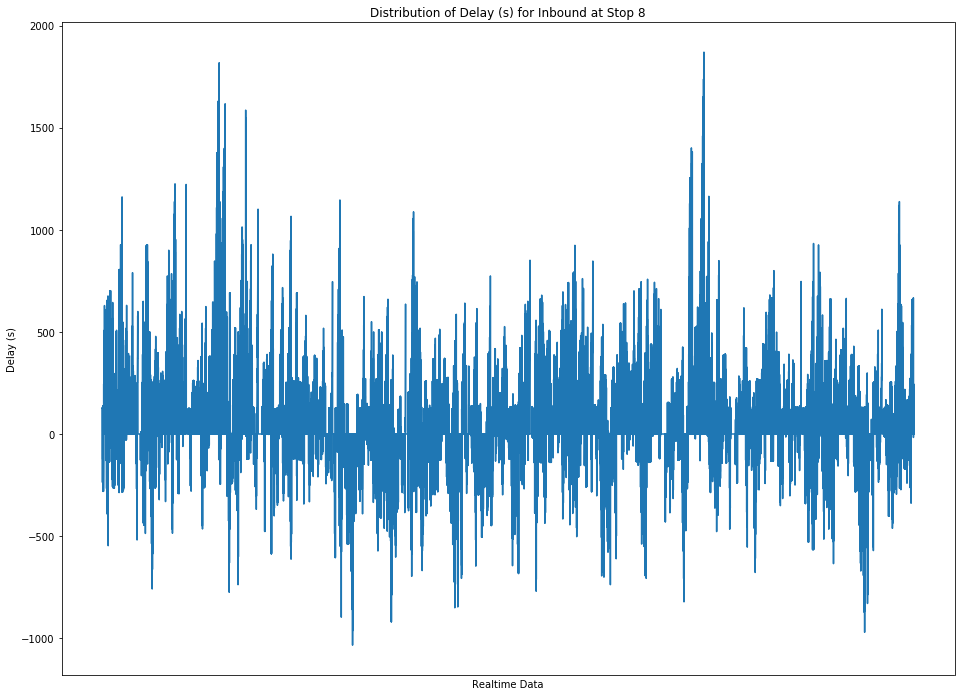

In [34]:
df_join[(df_join.StopNumber==8) & (df_join.MonitoredVehicleJourney_DirectionRef == 'I')].Delay_s.plot();
plt.title("Distribution of Delay (s) for Inbound at Stop 8");
plt.xlabel("Realtime Data");
plt.xticks([]);
plt.ylabel("Delay (s)");

The above plot shows that there are outliers in the positive direction and occasional ones in the negative direction too (observe the spikes). These sporadic delays does not hint on the general sense of a stop and can bias the mean. So, we need to cap them. Let's try it out and see the results.

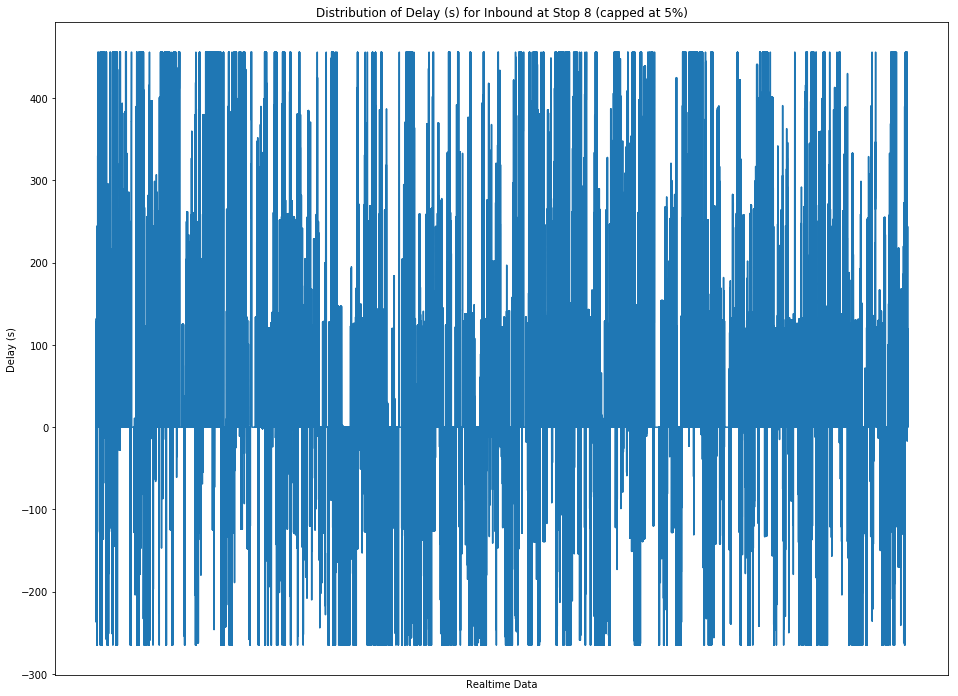

In [35]:
temp = df_join[(df_join.StopNumber==8) & (df_join.MonitoredVehicleJourney_DirectionRef == 'I')].Delay_s
temp.clip(temp.quantile(0.05), temp.quantile(0.95)).plot();
plt.title("Distribution of Delay (s) for Inbound at Stop 8 (capped at 5%)");
plt.xlabel("Realtime Data");
plt.xticks([]);
plt.ylabel("Delay (s)");

The capping shows an immediate improvement of the results, but still we can observe the spikes. Let's try to cap it by 5 more percent.

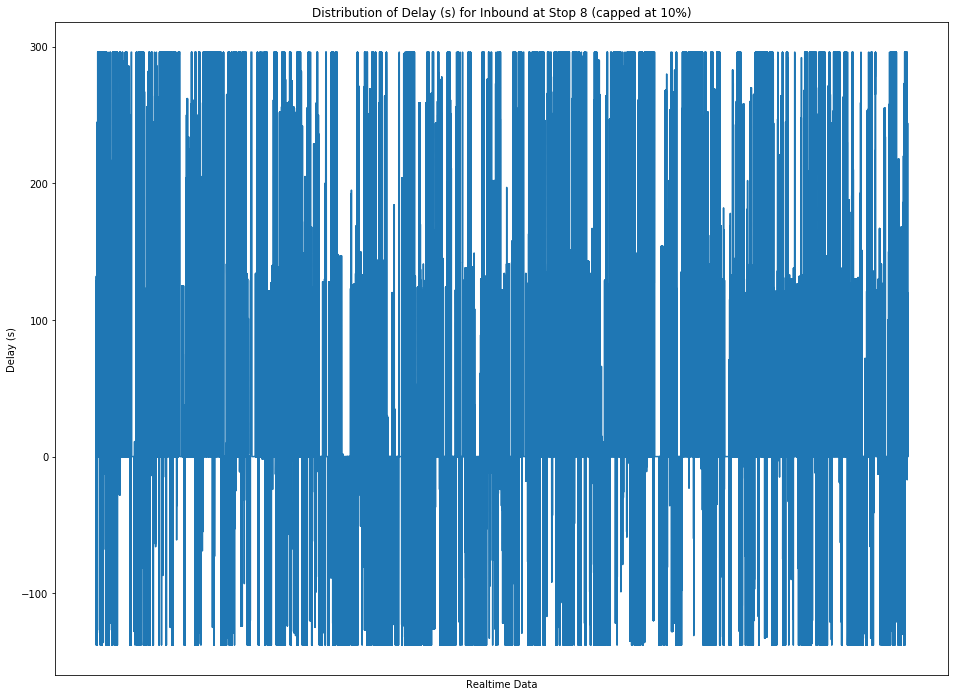

In [36]:
temp.clip(temp.quantile(0.1), temp.quantile(0.9)).plot();
plt.title("Distribution of Delay (s) for Inbound at Stop 8 (capped at 10%)");
plt.xlabel("Realtime Data");
plt.xticks([]);
plt.ylabel("Delay (s)");

Using the 2 quatiles, we see make an suumption that 0.1 and 0.9 is the best suited value for capping and also it makes the data look more realistic. This also gives an idea. Lets take and example to prove the point.

Suppose an extreme observation is like 
-10, -10, -9, -10, -8, -10, 200, 200, -10, 300, -8
Once capped, it becomes
-10, -10, -9, -10, -8, -10, 200, 200, -10, 200, -8

Altough the average is 47, we might be loosing some information of it being before time being higher than that of delayed times. So, for clustering we want to introduce 2 new variables that keeps tract of count of coming before and delayed.

Now let's look at a quick distribution of the data when capped on all the grouped items. The list is big, but still we can make some sense if our intuition is correct.

In [37]:
grouped = df_join.groupby(['StopNumber', 'MonitoredVehicleJourney_DirectionRef'])
keys = list(grouped.groups.keys())

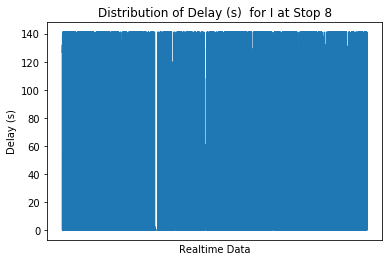

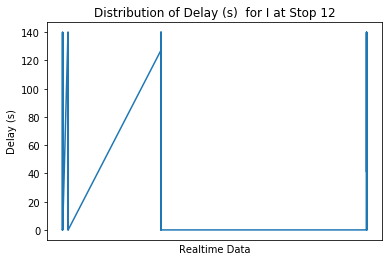

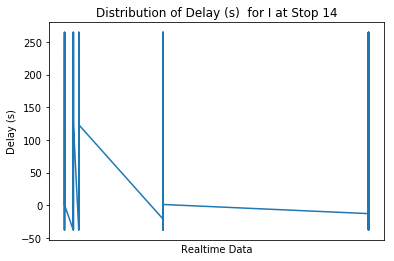

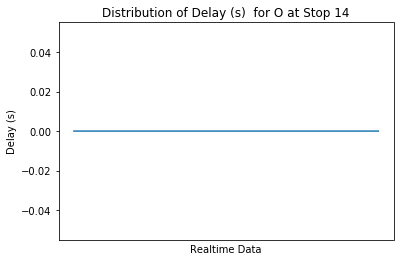

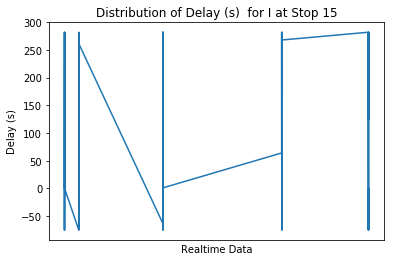

...

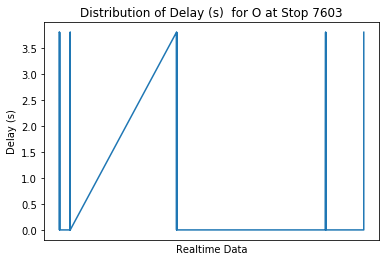

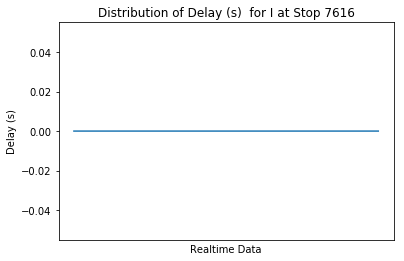

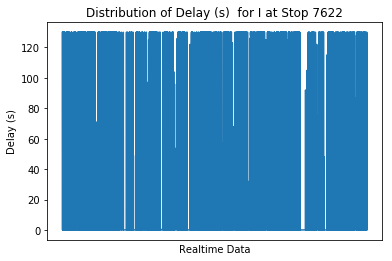

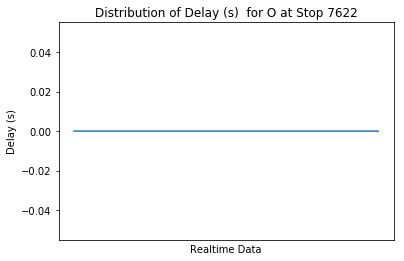

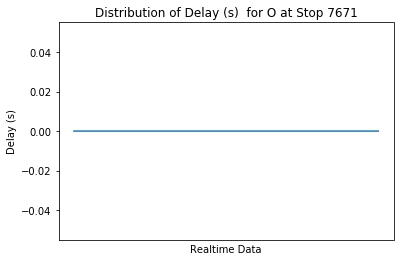

In [38]:
import matplotlib.pyplot as plt
%matplotlib inline
for key in tqdm(keys):
    temp = grouped.get_group(key).Delay_s
    temp.clip(temp.quantile(0.2), temp.quantile(0.8)).plot();
    plt.title("Distribution of Delay (s)  for {} at Stop {}".format(key[1], key[0]));
    plt.xlabel("Realtime Data");
    plt.xticks([]);
    plt.ylabel("Delay (s)");
    plt.show();

Looking at this dataset, we can see that some of the data have some occasional spikes. It can be misinterpreted as those occassional spikes can actually hamper the average. But when looking at at a macroscopic level, they won't because the number of normal delays will override all pull the mean towards them. This can be explained as road repairing, accidents, etc which is the reason behind these occasional spikes.

In [39]:
def fn_median(s):
    s = s.clip(s.quantile(0.05), s.quantile(0.95))
    return np.median(s)

def fn_mean(s):
    s = s.clip(s.quantile(0.2), s.quantile(0.8))
    return np.mean(s)

def fn_early(s):
    return len(s[s<0])

def fn_delay(s):
    return len(s[s>0])

def fn_on_time(s):
    return len(s[s==0])

In [40]:
df_join.groupby(['StopNumber', 'MonitoredVehicleJourney_DirectionRef']).agg(
    {'DistanceTraveled_km': ['median', fn_median],
     'Delay_s': ['mean', fn_mean, fn_early, fn_delay, fn_on_time],
     'Delay_s_per_km': ['mean', fn_mean]
    }
).head()

DistanceTraveled_km            \
                                                             median fn_median   
StopNumber MonitoredVehicleJourney_DirectionRef                                 
8          I                                                 2.5780    2.5780   
12         I                                                 1.2108    1.2108   
14         I                                                 0.5738    0.5738   
           O                                                 0.5360    0.5360   
15         I                                                 0.7226    0.7226   

                                                    Delay_s             \
                                                       mean    fn_mean   
StopNumber MonitoredVehicleJourney_DirectionRef                          
8          I                                      55.113173  44.536482   
12         I                                      49.122391  43.395680   
14         I                                      95.276127  85.787101   
           O                                      11.089844   0.000000   
15         I                                     103.897631  87.510760   

                                                                              \
                                                fn_early fn_delay fn_on_time   
StopNumber MonitoredVehicleJourney_DirectionRef                                
8          I                                        3356     6428       8595   
12         I                                        9633    18330      25464   
14         I                                       13849    28756      18222   
           O                                         187      522       5268   
15         I                                       12117    24862      12880   

                                                Delay_s_per_km              
                                                          mean     fn_mean  
StopNumber MonitoredVehicleJourney_DirectionRef                             
8          I                                         21.378267   17.275594  
12         I                                         41.604760   37.178352  
14         I                                        172.544086  153.858460  
           O                                         20.690008    0.000000  
15         I                                        143.783049  121.105398

So, since everything looks good, we'll export this as our final clustering dataset.

In [41]:
df_cluster = df_join.groupby(['StopNumber', 'MonitoredVehicleJourney_DirectionRef']).agg(
    {'DistanceTraveled_km': [fn_median],
     'Delay_s': [fn_mean, fn_early, fn_delay, fn_on_time],
     'Delay_s_per_km': [ fn_mean]
    }
)

df_cluster = df_cluster.reset_index()
df_cluster.columns = ['StopNumber', 'MonitoredVehicleJourney_DirectionRef', 'DistanceTraveled_km', 'Delay_s', 'EarlyCount', 'DelayCount', 'OnTimeCount', 'Delay_s_per_km']

In [42]:
df_cluster.head()

,StopNumber,MonitoredVehicleJourney_DirectionRef,DistanceTraveled_km,Delay_s,EarlyCount,DelayCount,OnTimeCount,Delay_s_per_km
0,8,I,2.5780,44.536482,3356,6428,8595,17.275594
1,12,I,1.2108,43.395680,9633,18330,25464,37.178352
2,14,I,0.5738,85.787101,13849,28756,18222,153.858460
3,14,O,0.5360,0.000000,187,522,5268,0.000000
4,15,I,0.7226,87.510760,12117,24862,12880,121.105398


In [43]:
df_cluster.shape

(749, 8)

In [44]:
# df_cluster.to_csv('clustering_dataset.csv', index=False)